In [1]:
!pip3 install tensorflow-gpu==1.14.0
#pip3 install tensorflow-gpu==2.0.0
#!pip3 install tensorflow-gpu==1.8.0




     |████████████████████████████████| 377.0 MB 11 kB/s s eta 0:00:01
     |████████████████████████████████| 127 kB 71.5 MB/s eta 0:00:01
     |████████████████████████████████| 4.0 MB 31.7 MB/s eta 0:00:01
     |████████████████████████████████| 50 kB 12.0 MB/s eta 0:00:01
     |████████████████████████████████| 42 kB 2.3 MB/s  eta 0:00:01
     |████████████████████████████████| 3.1 MB 49.1 MB/s eta 0:00:01
     |████████████████████████████████| 96 kB 9.8 MB/s  eta 0:00:01
     |████████████████████████████████| 488 kB 57.8 MB/s eta 0:00:01
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4830 sha256=2d327c0c258ce933350339a995bb2e42d7df59253adea81cccc2c43c8cf7801e
  Stored in directory: /home/ec2-user/.cache/pip/wheels/93/2a/eb/e58dbcbc963549ee4f065ff80a59f274cc7210b6eab962acdc
Successfully built termcolor
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [2]:

!pip3 install keras==2.3

     |████████████████████████████████| 377 kB 6.0 MB/s eta 0:00:01
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [2]:
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)

In [3]:
#import tensorflow
import pandas as pd

In [4]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D
import matplotlib.pyplot as plt
from keras import backend as K
import numpy as np
from sklearn.model_selection import train_test_split

Using TensorFlow backend.


In [5]:
from keras.layers import Dense, Conv2D, Dropout, BatchNormalization, Input, Reshape, Flatten, Conv2DTranspose, MaxPooling2D, UpSampling2D
from keras.models import Model, Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [6]:
from PIL import Image, ImageOps 
from numpy import array
import numpy as np
import os
import cv2

In [7]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

In [8]:
reduced_width,reduced_height=256,256

### Quick check

In [6]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()


11493376/11490434 [==============================] - 5s 0us/step


In [5]:
x_train.shape,y_train.shape

((60000, 28, 28), (60000,))

In [6]:
x_test.shape, y_test.shape

((10000, 28, 28), (10000,))

## Pre-Processing

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_path = '/content/drive/My Drive/BRICS - TB Latente/Dados'

In [8]:
india_path      = os.path.join(data_path, 'indimag')
montgomery_path = os.path.join(data_path, 'MontgomerySet') 
china_path      = os.path.join(data_path, 'ChinaSet_AllFiles')

In [9]:
def resize_img(m_img, size=(1024, 1024)):  
    img_pil = Image.fromarray(m_img)
    return np.array(img_pil.resize(size, Image.ANTIALIAS))

### Import images

In [9]:
input_dir='../ChinaSet_AllFiles/CXR_png'
#input_dir=os.path.join(china_path, 'CXR_png')
#input_dir='/content/drive/My Drive/BRICS - TB Latente/Dados/ChinaSet_AllFiles/CXR_png'
#input_dir='/jupyter_dir/Workspace/TB/ChinaSet_AllFiles/CXR_png'
files = sorted([x for x in os.listdir(input_dir) if '.png' in x])

In [10]:
info_dir='../ChinaSet_AllFiles/ClinicalReadings'
info_files = sorted([x for x in os.listdir(info_dir) if '.txt' in x])

In [11]:
%%time
info_dict={}
info_list_all=[]
for info_file in info_files:
    new_info_list = []
    info_list = open(os.path.join(info_dir,info_file)).readlines()    
    info_list = [x.replace('\n','').replace('\t','').replace(' , ',' ').replace(',','').replace('16month','1yrs').replace('64days','0yrs') for x in info_list]
    
    if len(info_list) ==2:
        #print(info_file, len(info_list),info_list)
        new_info_list.append(info_file.split('.')[0])
        new_info_list.append(info_list[0].split(' ')[0].lower())
        new_info_list.append(info_list[0].split(' ')[1].replace('yrs','').replace('yr',''))
        new_info_list.append(info_list[1].lower())

    elif len(info_list) ==3 and info_list[1] == '':
        #print(info_file, len(info_list),info_list)
        new_info_list.append(info_file.split('.')[0])
        new_info_list.append(info_list[0].split(' ')[0].lower())
        new_info_list.append(info_list[0].split(' ')[1].replace('yrs','').replace('yr',''))
        new_info_list.append(info_list[2].lower())
    else:
        #print(info_file, len(info_list),info_list)  
        new_info_list.append(info_file.split('.')[0])
        new_info_list.append(info_list[0].split(' ')[0].lower())
        new_info_list.append(info_list[0].split(' ')[1].replace('yrs','').replace('yr',''))
        new_info_list.append(', '.join(info_list[1:]).lower())

    new_info_list = [x.strip() for x in new_info_list]
    info_dict[info_file.split('.')[0]] = new_info_list
    info_list_all.append(new_info_list)
    

CPU times: user 36.7 ms, sys: 4.15 ms, total: 40.9 ms
Wall time: 39.5 ms


In [12]:
%%time
nameList=[]
count=0
for file in files:
    #print(count,file)
    count+=1
    nameList.append(file)

CPU times: user 153 µs, sys: 0 ns, total: 153 µs
Wall time: 160 µs


In [20]:
#info_list_all

In [221]:
#a = ['male 32yrs', 'STB', 'ATB', 'tuberculosis pleuritis']

In [21]:
df = pd.DataFrame(info_list_all)
df.columns = ['name','genero','idade','laudo']

In [22]:
df['idade'] = df['idade'].astype(int)

In [23]:
df[~df['genero'].isin(['male','female'])].sort_values(by='name')

,name,genero,idade,laudo


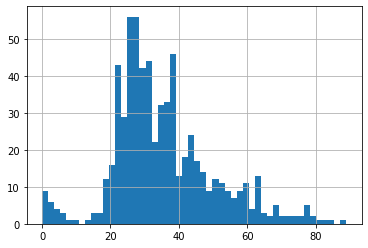

In [24]:
df['idade'].hist(bins=50)

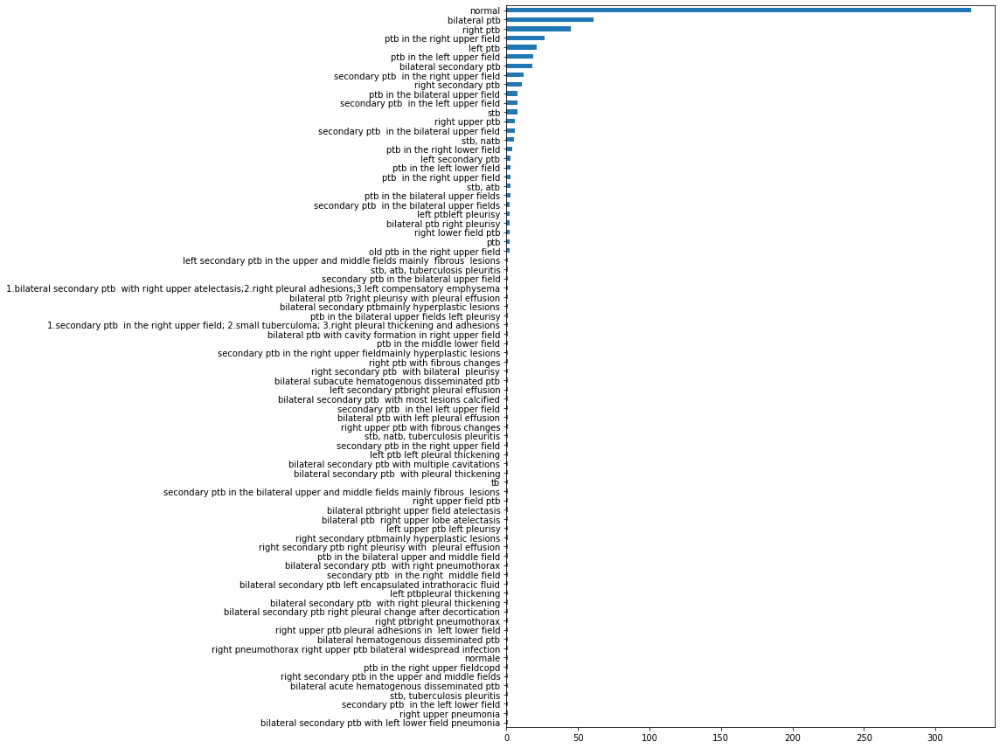

In [33]:
ax, fig = plt.subplots(1,1,figsize=(16,12))
df['laudo'].value_counts(normalize=False).plot.barh().invert_yaxis()
plt.tight_layout()

In [34]:
#df['laudo'].unique()

In [35]:
df['genero'].value_counts(normalize=True)

male      0.678248
female    0.321752
Name: genero, dtype: float64

In [36]:
#df['idade'].astype(int)
#df.sort_values(by='idade')

#df[df['idade']=='20s']#.sort_values(by='name')

In [37]:
#List = open(os.path.join(info_dir,info_files[0])).readlines()
#import pandas as pd
#pd.DataFrame(info_dict)
#info_dict

In [38]:
#info_file.split('.')

In [39]:
#serpentina = False

In [40]:
len(files)

662

### Transform images

 - Grayscale
 - Resize to 256x256
 - Create array of images: nx256x256, where n is the number of images 

In [13]:
def transform_to_1D(m_array):
    m_array[1::2] = m_array[1::2, ::-1]

    return m_array.ravel()

In [14]:
def back_to_img(arr, m_pixels):
    import copy
    vec = copy.deepcopy(arr)
    size=(m_pixels, m_pixels)
    # 1 back to array
    tmp = vec.reshape(size)
    # 2 turn the order back
    tmp[1::2] = tmp[1::2, ::-1]
    return tmp

### Plot pictures

In [15]:
filepath=os.path.join(input_dir,files[0]) 
filepath

'../ChinaSet_AllFiles/CXR_png/CHNCXR_0001_0.png'

In [18]:
import skimage
skimage.io.imread(filepath, as_gray=False).shape

AttributeError: module 'skimage' has no attribute 'io'

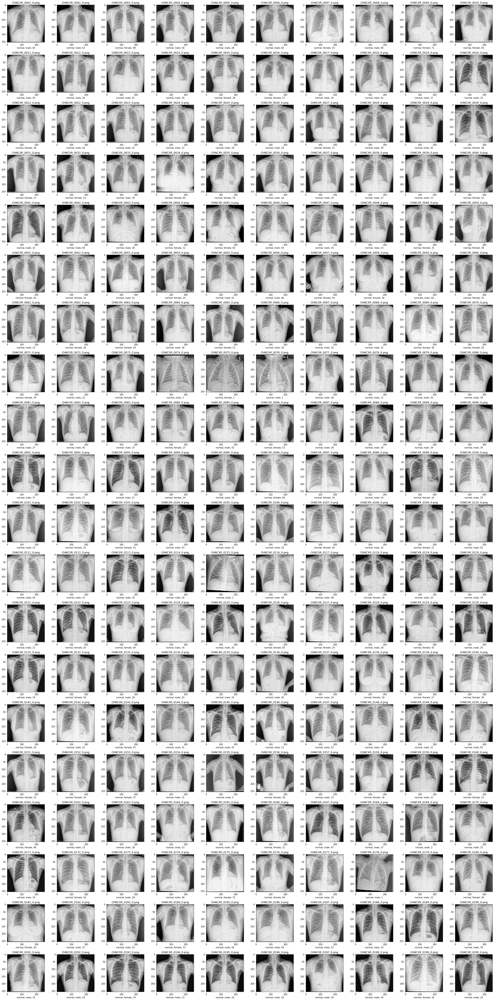

In [239]:
fig, axs = plt.subplots(nrows=20, ncols=10,figsize=(32,64))
ax = axs.ravel()

for idx,file in enumerate(sorted(files)[:200]):
    filepath=os.path.join(input_dir,file)  

    img = Image.open(filepath) 
    img = img.convert('L')
    arr = array(img)
    if len(arr.shape) == 3:
        arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    img2 = Image.fromarray(arr)
    img3 = img2.resize((reduced_width,reduced_height), Image.ANTIALIAS)    
    arr3 = np.asarray(img3)
    ax[idx].imshow(arr3, cmap='gray', vmin=0, vmax=255)
    ax[idx].set_title(file)
    ax[idx].set_xlabel(info_dict[file.split('.')[0]][-1]+', '+info_dict[file.split('.')[0]][1]+', '+info_dict[file.split('.')[0]][2])
    
plt.tight_layout()

In [232]:
#info_dict[file.split('.'[0])][-1]

file.split('.')[0]

'CHNCXR_0001_0'

In [91]:
files[600]

'CHNCXR_0004_0.png'

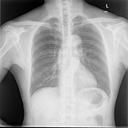

In [16]:
#labelList

In [ ]:
%%time
labelList=[]
imList=[]
nameList=[]
count=0
for file in files:
    print(count,file)
    count+=1
    nameList.append(file)
    #print(file,count)
    filepath=os.path.join(input_dir,file)   
    img = Image.open(filepath).convert('L')
    arr = array(img)
    if len(arr.shape) == 3:
        arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    img2 = Image.fromarray(arr)
    img3 = img2.resize((reduced_width,reduced_height), Image.ANTIALIAS)
    arr3 = np.array(img2.resize((reduced_width,reduced_height), Image.ANTIALIAS))
    imList.append(arr3)
    labelList.append(int(file.split('.png')[0].split('_')[-1]))
    #print(file,arr3.shape)

In [44]:
X_images = np.array(imList)

In [31]:
#files

In [46]:
%%time
##if serpentina

labelList=[]
imList=[]
count=0
for file in files:
    count+=1
    #print(file,count)
    filepath=os.path.join(input_dir,file)   
    img = Image.open(filepath).convert('L')
    arr = array(img)
    if len(arr.shape) == 3:
        arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    img2 = Image.fromarray(arr)
    img3 = img2.resize((reduced_width,reduced_height), Image.ANTIALIAS)
    arr3 = np.array(img2.resize((reduced_width,reduced_height), Image.ANTIALIAS))
    arr3 = transform_to_1D(arr3)
    imList.append(arr3)
    labelList.append(int(file.split('.png')[0].split('_')[-1]))
    #print(file,arr3.shape)

CPU times: user 2min 8s, sys: 1.56 s, total: 2min 9s
Wall time: 2min 9s


In [47]:
X = np.array(imList)

In [48]:
Y = np.array(labelList)

In [49]:
X.shape, X_images.shape

((662, 65536), (662, 256, 256))

In [50]:
np.save('./data/X_'+str(reduced_width)+'x'+str(reduced_height)+'_v2.npy',X)
np.save('./data/X_images_'+str(reduced_width)+'x'+str(reduced_height)+'_v2.npy',X_images)
np.save('./data/Y_'+str(reduced_width)+'x'+str(reduced_height)+'_v2.npy',Y)

In [15]:
X = np.load('./data/X_256x256_v2.npy')
X_images = np.load('./data/X_images_256x256_v2.npy')
Y = np.load('./data/Y_256x256_v2.npy')


In [16]:
X.shape,X_images.shape

((662, 65536), (662, 256, 256))

In [18]:
X_images[100].shape

(256, 256)

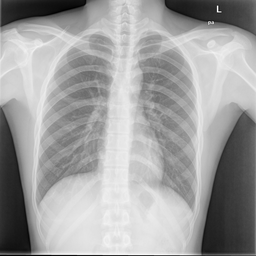

In [19]:
Image.fromarray(X_images[100])

In [108]:
#type(X_images)
X[0]

array([31, 30, 28, ...,  0,  0,  0], dtype=uint8)

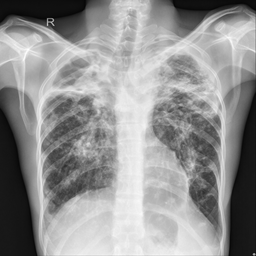

In [109]:
Image.fromarray(back_to_img(X[100],256))

In [242]:
#Image.fromarray(G[0])
#Image.fromarray(back_to_img(X[0],256))

for ipic in range(X.shape[0]):
    ximg = X_images[ipic]
    rimg = back_to_img(X[ipic],128)

    #print(ipic,ssim(ximg, rimg, data_range=rimg.max() - rimg.min()))

ValueError: cannot reshape array of size 65536 into shape (128,128)

### Convolutional Autoencoder

(256, 256, 1)

In [16]:
def create_cnn_ae(summary=True):

    input_shape = (reduced_width,reduced_height,1)
    input_shape

    model = Sequential()
    convkernel=(3,3)
    #1st convolution layer
    model.add(Conv2D(16, convkernel #64 is number of filters and (3, 3) is the size of the filter.
        , padding='same', input_shape=input_shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

    #2nd convolution layer
    model.add(Conv2D(32,convkernel, padding='same')) # apply 16 filters sized of (3x3)
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

    #2nd convolution layer
    model.add(Conv2D(2,convkernel, padding='same')) # apply 16 filters sized of (3x3)
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

    #3rd convolution layer
    #model.add(Conv2D(128,convkernel, padding='same')) # apply 2 filters sized of (3x3)
    #model.add(Activation('relu'))
    #model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

    #model.add(Flatten())
    #model.add(Dense(units = 8192, activation = 'relu'))

    #model.add(Dense(units = 6000, activation = 'relu'))

    #-------------------------
    #model.add(Dense(units = 8192, activation = 'relu'))

    #model.add(Reshape((64,64,2)))

    #4 convolution layer
    #model.add(BatchNormalization())
    #model.add(Conv2D(128,convkernel, padding='same')) # apply 2 filters sized of (3x3)
    #model.add(Activation('relu'))
    #model.add(UpSampling2D((2, 2)))

    #5 convolution layer
    #model.add(BatchNormalization())
    model.add(Conv2D(2,convkernel, padding='same'))
    model.add(Activation('relu'))
    model.add(UpSampling2D((2, 2)))


    #5 convolution layer
    #model.add(BatchNormalization())
    model.add(Conv2D(32,convkernel, padding='same'))
    model.add(Activation('relu'))
    model.add(UpSampling2D((2, 2)))

    #6 convolution layer
    #model.add(BatchNormalization())
    model.add(Conv2D(16,convkernel, padding='same'))
    model.add(Activation('relu'))
    model.add(UpSampling2D((2, 2)))


    #-------------------------

    model.add(Conv2D(1,convkernel, padding='same'))
    model.add(Activation('sigmoid'))
    #model.add(Activation('relu'))

    if summary:
        model.summary()
    
    return model

In [17]:
create_cnn_ae()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 256, 256, 16)      160       
_________________________________________________________________
activation_1 (Activation)    (None, 256, 256, 16)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
activation_2 (Activation)    (None, 128, 128, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 2)       

### Autoencoder

In [18]:
X.shape

(662, 65536)

In [26]:
from keras import layers

def create_stacked_ae(summary=True):
    # This is the size of our encoded representations
    encoding_dim = 500  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

    # This is our input image
    input_img = keras.Input(shape=(X.shape[1],))
    # "encoded" is the encoded representation of the input
    encoded = layers.Dense(1000, activation='relu')(input_img)

    encoded = layers.Dense(encoding_dim, activation='relu')(encoded)
    #encoded = layers.Dense(2000, activation='relu')(encoded)
    #encoded = layers.Dense(2000, activation='relu')(encoded)

    decoded = layers.Dense(1000, activation='relu')(encoded)
    #decoded = layers.Dense(2000, activation='relu')(encoded)
    #decoded = layers.Dense(2000, activation='relu')(decoded)


    # "decoded" is the lossy reconstruction of the input
    decoded = layers.Dense(X.shape[1], activation='sigmoid')(encoded)

    # This model maps an input to its reconstruction
    model = keras.Model(input_img, decoded)
    
    encoder = keras.Model(input_img, encoded)
    
    # This is our encoded (32-dimensional) input
    encoded_input = keras.Input(shape=(encoding_dim,))
    # Retrieve the last layer of the autoencoder model
    decoder_layer = model.layers[-1]
    # Create the decoder model
    decoder = keras.Model(encoded_input, decoder_layer(encoded_input))
    
    if summary:
        model.summary()
    return model, encoder, decoder

In [27]:
create_stacked_ae()

Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, 65536)             0         
_________________________________________________________________
dense_21 (Dense)             (None, 1000)              65537000  
_________________________________________________________________
dense_22 (Dense)             (None, 500)               500500    
_________________________________________________________________
dense_24 (Dense)             (None, 65536)             32833536  
Total params: 98,871,036
Trainable params: 98,871,036
Non-trainable params: 0
_________________________________________________________________


(<keras.engine.training.Model at 0x7f5aad5020b8>,
 <keras.engine.training.Model at 0x7f5aad5158d0>)

In [21]:
X.shape

(662, 65536)

In [22]:
#X[0]/255,x_train[0]

## Choose parameters for training

In [34]:
from datetime import datetime
from datetime import timedelta

now = datetime.now()-timedelta(hours = 3) # current date and time
date_time = now.strftime("%d%m%y%H%M%S")
#print("date and time:",date_time)

serpentina=True

if serpentina:
    model_type='stacked'
    model, encoder, decoder = create_stacked_ae()
else:
    model_type='cnn'
    model = create_cnn_ae()

ae='TB'
#version=date_time
version='2021_3'
run_name=model_type+'-autoencoder-'+ae+'-V'+version
run_folder='./run/'+run_name
if not os.path.exists(run_folder):
    os.mkdir(run_folder)
    

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        (None, 65536)             0         
_________________________________________________________________
dense_45 (Dense)             (None, 1000)              65537000  
_________________________________________________________________
dense_46 (Dense)             (None, 500)               500500    
_________________________________________________________________
dense_48 (Dense)             (None, 65536)             32833536  
Total params: 98,871,036
Trainable params: 98,871,036
Non-trainable params: 0
_________________________________________________________________


In [30]:
#y_train
#imdata.shape
#name_train


In [35]:
%%time
from sklearn.model_selection import KFold
kf = KFold(n_splits=3,random_state=42,shuffle=True)
#len(kf)
print(kf)  
hList=[]
train_mse_fold=[]
train_ssim_fold=[]
test_mse_fold=[]
test_ssim_fold=[]
count=0

if serpentina:
    imdata = X
else:
    imdata = X_images
for train_index, test_index in kf.split(imdata):
    count+=1
    print("Fold: "+str(count))
    if not os.path.exists(os.path.join(run_folder,'fold'+str(count))):
        os.mkdir(os.path.join(run_folder,'fold'+str(count)))
        
    print("TRAIN:", len(train_index), "TEST:", len(test_index))
    x_train, x_test = imdata[train_index], imdata[test_index]
    y_train, y_test = Y[train_index], Y[test_index]
    name_train, name_test = [nameList[idx] for idx in train_index], [nameList[idx] for idx in test_index]
    
    if ae=='normal':
        x_train = x_train[np.where(y_train == 0)]
        y_train = y_train[np.where(y_train == 0)]
        name_train = [nameList[idx] for idx in np.where(y_train == 0)[0].tolist()] 
        
        [nameList[idx] for idx in train_index]
    elif ae=='TB':
        x_train = x_train[np.where(y_train == 1)]
        y_train = y_train[np.where(y_train == 1)]
        name_train = [nameList[idx] for idx in np.where(y_train == 1)[0].tolist()]
        
    name_train = [x.replace('.png','') for x in name_train]
    name_test = [x.replace('.png','') for x in name_test]
    
    print("Y Train Dist")
    print(pd.DataFrame(y_train)[0].value_counts())
    print("Y Test Dist")
    print(pd.DataFrame(y_test)[0].value_counts())
    
    model=None
    if serpentina:
        print("Using Stacked-AE")
        model, encoder, decoder = create_stacked_ae()

    else:
        print("Using CNN-AE")
        model = create_cnn_ae()
        
        x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], 1) #transform 2D 28x28 matrix to 3D (28x28x1) matrix
        x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], 1)

    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')

    x_train /= 255 #inputs have to be between [0, 1]
    x_test /= 255
    
    print("Training")
    
    model.compile(optimizer='adam', loss='mse')
    es = EarlyStopping(monitor='val_loss', verbose=2, patience=30)
    history = model.fit(x_train, x_train
    , epochs=300
    , batch_size = 64
    , validation_data=(x_test, x_test)
    , callbacks=[es]
    , verbose=1         
                    )
    hList.append(history)
    
    print("Checking reconstruction")
    
    print("Training information")
    
    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'train')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'train'))

    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'train_reconstructed')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'train_reconstructed'))
        
    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'train_RE')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'train_RE'))
        
    restored_imgs = model.predict(x_train,batch_size=4,verbose=1)
    mse_list=[]
    mae_list=[]
    ssim_list=[]

    if serpentina:
        for i in range(x_train.shape[0]):
            ximg = back_to_img(x_train[i],reduced_width)
            rimg = back_to_img(restored_imgs[i],reduced_width)
            
            mse_img =  mean_squared_error(ximg, rimg)
            ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
            mse_list.append(mse_img)        
            ssim_list.append(ssim_img)
            #print(1)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),255*ximg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            #print(2)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train_reconstructed',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),255*rimg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train_RE',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),(255 - ((ximg - rimg)**2)).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min((255 - ((ximg - rimg)**2))), vmax=np.max(255 - ((ximg - rimg)**2)))
            
    else:
        for i in range(x_train.shape[0]):
            ximg = x_train[i].reshape(reduced_width,reduced_height)
            rimg = restored_imgs[i].reshape(reduced_width,reduced_height)

            mse_img =  mean_squared_error(ximg, rimg)
            ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
            mse_list.append(mse_img)        
            ssim_list.append(ssim_img)

            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),255*ximg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train_reconstructed',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),255*rimg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'train_RE',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_train[i]+'_tb_'+str(y_train[i])+'.png'),(255 - ((ximg - rimg)**2)).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min((255 - ((ximg - rimg)**2))), vmax=np.max(255 - ((ximg - rimg)**2)))        

            
    np.save(os.path.join(run_folder,'fold'+str(count),'train_mse'),np.asarray(mse_list))
    np.save(os.path.join(run_folder,'fold'+str(count),'y_train'),y_train)

    print(np.mean(mse_list),np.std(mse_list))
    print(np.mean(ssim_list),np.std(ssim_list))
    train_mse_fold.append(np.mean(mse_list))  
    train_ssim_fold.append(np.mean(ssim_list))  
    
    print("Test information")
        
    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'test')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'test'))

    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'test_reconstructed')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'test_reconstructed'))
        
    if not os.path.exists(os.path.join(run_folder,'fold'+str(count),'test_RE')):
        os.mkdir(os.path.join(run_folder,'fold'+str(count),'test_RE'))
        
    test_restored_imgs = model.predict(x_test,batch_size=4,verbose=1)
    test_mse_list=[]
    test_mae_list=[]
    test_ssim_list=[]
    
    if serpentina:
        for i in range(x_test.shape[0]):
            ximg = back_to_img(x_test[i],reduced_width) 
            rimg = back_to_img(test_restored_imgs[i],reduced_width)

            mse_img =  mean_squared_error(ximg, rimg)
            ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
            test_mse_list.append(mse_img)        
            test_ssim_list.append(ssim_img)
            
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),255*ximg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test_reconstructed',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),255*rimg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test_RE',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),(255 - ((ximg - rimg)**2)).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min((255 - ((ximg - rimg)**2))), vmax=np.max(255 - ((ximg - rimg)**2)))    
    

    else:
        for i in range(x_test.shape[0]):
            ximg = x_test[i].reshape(reduced_width,reduced_height)
            rimg = test_restored_imgs[i].reshape(reduced_width,reduced_height)

            mse_img =  mean_squared_error(ximg, rimg)
            ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
            test_mse_list.append(mse_img)        
            test_ssim_list.append(ssim_img)
            #print(1)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),255*ximg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            #print(2)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test_reconstructed',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),255*rimg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)
            plt.imsave(os.path.join(run_folder,'fold'+str(count),'test_RE',"{:.7f}".format(float(str(mse_img))).replace('.','_')+'_RE_'+name_test[i]+'_tb_'+str(y_test[i])+'.png'),(255 - ((ximg - rimg)**2)).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min((255 - ((ximg - rimg)**2))), vmax=np.max(255 - ((ximg - rimg)**2)))
        
    np.save(os.path.join(run_folder,'fold'+str(count),'test_mse'),np.asarray(test_mse_list))     
    np.save(os.path.join(run_folder,'fold'+str(count),'y_test'),y_test)
    test_mse_fold.append(np.mean(test_mse_list))  
    test_ssim_fold.append(np.mean(test_ssim_list))  
    
    
    
    
    #plt.imsave('train_reconstructed',rimg.reshape(reduced_width,reduced_height))


KFold(n_splits=3, random_state=42, shuffle=True)
Fold: 1
TRAIN: 441 TEST: 221
Y Train Dist
1    233
Name: 0, dtype: int64
Y Test Dist
0    118
1    103
Name: 0, dtype: int64
Using Stacked-AE
Model: "model_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        (None, 65536)             0         
_________________________________________________________________
dense_49 (Dense)             (None, 1000)              65537000  
_________________________________________________________________
dense_50 (Dense)             (None, 500)               500500    
_________________________________________________________________
dense_52 (Dense)             (None, 65536)             32833536  
Total params: 98,871,036
Trainable params: 98,871,036
Non-trainable params: 0
_________________________________________________________________
Training


InternalError: GPU sync failed

In [33]:
from numba import cuda

#del history
#del model
#K.clear_session()

cuda.select_device(0)
cuda.close()

In [29]:
#clear_mem()



In [29]:
np.mean(train_ssim_fold),np.std(train_ssim_fold)

(0.8251828773711362, 0.00791181453927354)

In [25]:
np.mean(test_ssim_fold),np.std(test_ssim_fold)

(0.93453326637921, 0.005733512060295578)

In [26]:
np.mean(train_mse_fold),np.std(train_mse_fold)

(0.0003321448106276892, 3.641718108755074e-05)

In [27]:
np.mean(test_mse_fold),np.std(test_mse_fold)

(0.00033372026153432173, 4.3040191778020684e-05)

In [376]:
restored_imgs = model.predict(x_train,batch_size=4,verbose=1)

442/442 [==============================] - 0s 1ms/step


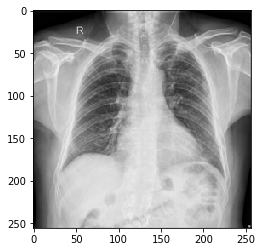

In [37]:
plt.imshow(255*ximg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)

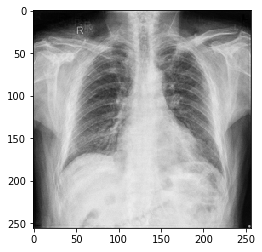

In [38]:
plt.imshow(255*rimg.reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)

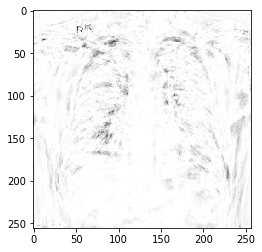

In [65]:

((rimg - ximg)**2)
plt.imshow((255 - ((rimg - ximg)**2)).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min(255-(rimg - ximg)**2), vmax=np.max(255-(rimg - ximg)**2))#

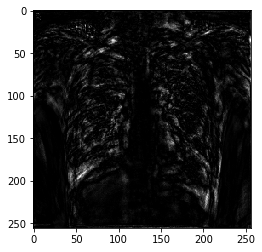

In [59]:
plt.imshow(((ximg - rimg)**2).reshape(reduced_width,reduced_height),cmap='gray', vmin=np.min((rimg - ximg)**2), vmax=np.max((rimg - ximg)**2))#

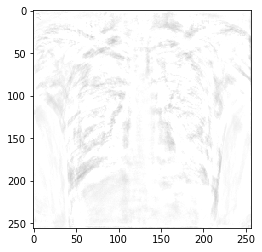

In [64]:
plt.imshow(255 - 255*((ximg - rimg)).reshape(reduced_width,reduced_height),cmap='gray', vmin=0, vmax=255)

In [87]:
import numpy as np
import os
from matplotlib import pyplot as plt

In [88]:
#run_name='deep-autoencoder_v5'
#run_folder='./run/'+run_name

### Train

Text(0.5, 1.0, 'Reconstruction Error')

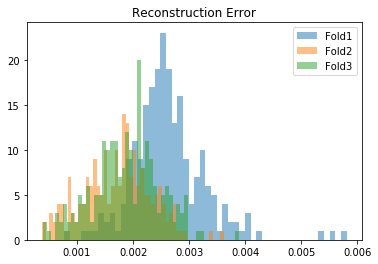

In [471]:
for ix in range(3):
    plt.hist(np.load(os.path.join(run_folder,'fold'+str(ix+1),'train_mse.npy')),label='Fold'+str(ix+1), bins=50,alpha=0.5)
plt.legend()
plt.title('Reconstruction Error')

Text(0.5, 1.0, 'Reconstruction Error')

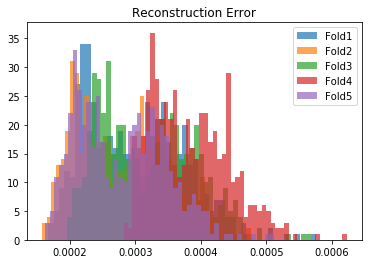

In [315]:
for ix in range(5):
    plt.hist(np.load(os.path.join(run_folder,'fold'+str(ix+1),'train_mse.npy')),label='Fold'+str(ix+1), bins=50,alpha=0.7)
plt.legend()
plt.title('Reconstruction Error')

### Test

Text(0.5, 1.0, 'Reconstruction Error')

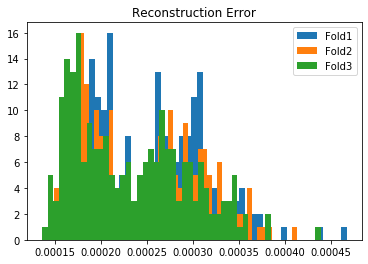

In [380]:
for ix in range(3):
    plt.hist(np.load(os.path.join(run_folder,'fold'+str(ix+1),'test_mse.npy')),label='Fold'+str(ix+1), bins=50)
plt.legend()
plt.title('Reconstruction Error')

In [58]:
#np.load(os.path.join(run_folder,'fold'+str(fold),'y_train.npy'))
run_folder

'./run/cnn-autoencoder_v2021_1'

In [24]:
len(fold_y)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

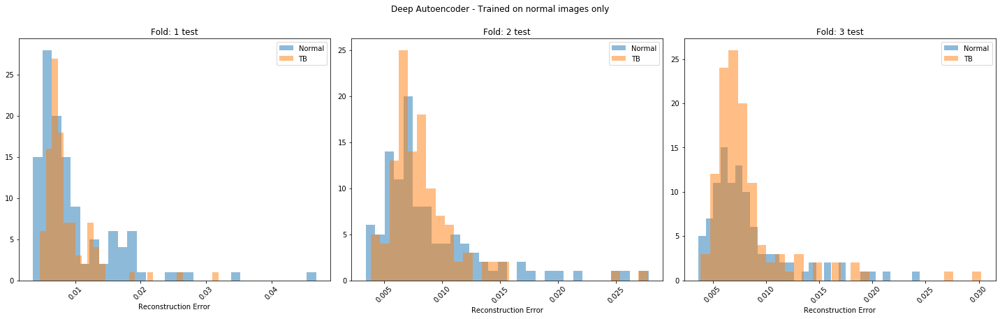

In [25]:
fig, axs = plt.subplots(nrows=1, ncols=3,figsize=(20,6))
#fold=3
ax = axs.ravel()
for idx in range(3):
    fold=idx+1
    phase='test'
    bins=30
    fold_y = np.load(os.path.join(run_folder,'fold'+str(fold),'y_'+phase+'.npy'))
    ax[idx].hist(np.load(os.path.join(run_folder,'fold'+str(fold),phase+'_mse.npy'))[np.where(fold_y == 0)],label='Normal', bins=bins,alpha=0.5,color='tab:blue')
    ax[idx].hist(np.load(os.path.join(run_folder,'fold'+str(fold),phase+'_mse.npy'))[np.where(fold_y == 1)],label='TB', bins=bins,alpha=0.5, color='tab:orange')
    ax[idx].set_xlabel("Reconstruction Error")
    #ax[idx].xticks(rotation=45)
    ax[idx].tick_params(axis='x', rotation=45)
    ax[idx].legend()
    ax[idx].set_title("Fold: "+str(fold)+" "+phase)
#fig.delaxes(ax[idx+1])
plt.suptitle('Deep Autoencoder - Trained on normal images only',y=1.05)
plt.tight_layout()


(array([ 2.,  5.,  6.,  8., 12., 19., 20., 21., 22., 27., 28., 19., 17.,
        16., 10., 10., 17., 13., 11., 18., 19., 19., 25., 21., 14., 18.,
        21., 15., 15., 11.,  9.,  5.,  8.,  7.,  3.,  6.,  5.,  0.,  1.,
         1.,  1.,  0.,  2.,  1.,  0.,  1.,  0.,  0.,  0.,  1.]),
 array([0.00034328, 0.00035952, 0.00037575, 0.00039199, 0.00040823,
        0.00042447, 0.00044071, 0.00045695, 0.00047319, 0.00048943,
        0.00050566, 0.0005219 , 0.00053814, 0.00055438, 0.00057062,
        0.00058686, 0.0006031 , 0.00061934, 0.00063558, 0.00065181,
        0.00066805, 0.00068429, 0.00070053, 0.00071677, 0.00073301,
        0.00074925, 0.00076549, 0.00078173, 0.00079796, 0.0008142 ,
        0.00083044, 0.00084668, 0.00086292, 0.00087916, 0.0008954 ,
        0.00091164, 0.00092788, 0.00094411, 0.00096035, 0.00097659,
        0.00099283, 0.00100907, 0.00102531, 0.00104155, 0.00105779,
        0.00107403, 0.00109026, 0.0011065 , 0.00112274, 0.00113898,
        0.00115522]),
 <a list of 50

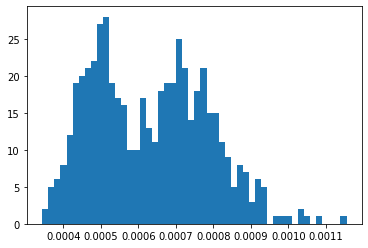

In [177]:
#plt.hist(np.load(os.path.join(run_folder,'fold'+str(5),'train_mse.npy')),label='Fold'+str(4), bins=50)

In [202]:
np.load(os.path.join(run_folder,'fold'+str(5),'train_mse.npy'))[np.where(y_train == 1)]

array([0.00053309, 0.00077085, 0.0008189 , 0.00071042, 0.000904  ,
       0.00069754, 0.00103188, 0.00066949, 0.00071346, 0.00071548,
       0.00067958, 0.00068008, 0.00103127, 0.0007735 , 0.00068071,
       0.00047556, 0.0006907 , 0.00071261, 0.00056626, 0.00050919,
       0.00078079, 0.00072485, 0.00065769, 0.00074267, 0.00070622,
       0.00073362, 0.0006254 , 0.00064657, 0.00076487, 0.00079996,
       0.00076068, 0.00071196, 0.00093563, 0.0007695 , 0.00081409,
       0.00075697, 0.00092455, 0.0007329 , 0.00077993, 0.00076157,
       0.00070105, 0.00068901, 0.00078288, 0.00071254, 0.00077029,
       0.00070218, 0.00079338, 0.0008091 , 0.00076945, 0.00085677,
       0.00080055, 0.00077983, 0.00072141, 0.00065151, 0.00104954,
       0.00078421, 0.00076422, 0.00051143, 0.00079384, 0.0008463 ,
       0.00082463, 0.00065292, 0.000724  , 0.00074091, 0.0006743 ,
       0.00041615, 0.00093647, 0.0004388 , 0.00092863, 0.00059603,
       0.0006887 , 0.00078699, 0.00048985, 0.00060894, 0.00087

In [201]:
len(y_train[y_train==1])
#np.where(y_train == 1)


281

In [181]:
np.load(os.path.join(run_folder,'fold'+str(5),'train_mse.npy'))

(530,)

In [65]:
import seaborn as sns

Text(0.5, 1.0, 'Reconstruction Error')

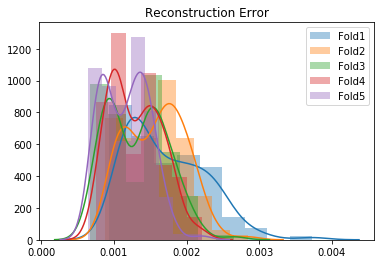

In [93]:
for ix in range(5):

    sns.distplot(np.load(os.path.join(run_folder,'fold'+str(ix+1),'test_mse.npy')),label='Fold'+str(ix+1))
plt.legend()
plt.title('Reconstruction Error')

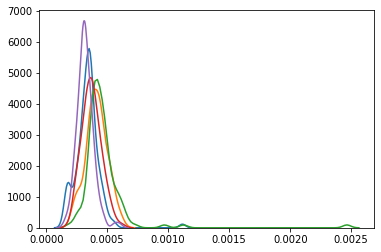

In [268]:
for ix in range(5):

    sns.kdeplot(np.load(os.path.join(run_folder,'fold'+str(ix+1),'test_mse.npy')))

In [28]:
#run_folder ='./run/cnn-autoencoder_v21'
#run_folder ='./run/cnn-autoencoder_v21'
run_folder

'./run/deep-autoencoder_v27normal'

In [93]:
#os.listdir(dirin)

In [133]:
import matplotlib.image as mpimg
fold=2
dirin=os.path.join(run_folder,'fold'+str(fold),'test')

list_of_files = sorted(os.listdir(dirin)) #+str(mse_img).replace('.','_')+'_'+'image'+str(i)+'.png')
list_of_files = [x for x in list_of_files if '_0.png' in x]
#sorted(list_of_files)
print(len(sorted(list_of_files)))

530


In [145]:
list_normal = [x.replace('image','').replace('.png','').replace('_CHN','_RE_CHN') for x in list_of_files if '_0.png' in x]
list_tb = [x.replace('image','').replace('.png','').replace('_CHN','_RE_CHN') for x in list_of_files if '_1.png' in x]

In [151]:
#list_normal
#sorted(list_normal)[:32]#[::-1]

In [152]:
#sorted(list_of_files)[::-1][:32]

###Normal

#similarity
#NLRE
with open('AENormal_normal_similarity_NLRE.txt', 'w') as f:
    for item in sorted(list_normal)[:32]:
        f.write("%s\n" % item)
        
#THRE
with open('AENormal_tb_similarity_THRE.txt', 'w') as f:
    for item in sorted(list_tb)[::-1][:32]:
        f.write("%s\n" % item)

#dissimilarity
#NHRE
with open('AENormal_normal_dissimilarity_NHRE.txt', 'w') as f:
    for item in sorted(list_normal)[::-1][:32]:
        f.write("%s\n" % item)

#TLRE
with open('AENormal_tb_dissimilarity_TLRE.txt', 'w') as f:
    for item in sorted(list_tb)[:32]:
        f.write("%s\n" % item)

In [ ]:
###TB

#similarity
#NHRE
with open('AETB_normal_similarity_NHRE.txt', 'w') as f:
    for item in sorted(list_normal)[::-1][:32]:
        f.write("%s\n" % item)
        
#TLRE
with open('AETB_tb_similarity_TLRE.txt', 'w') as f:
    for item in sorted(list_tb)[:32]:
        f.write("%s\n" % item)

#dissimilarity
#NLRE
with open('AETB_normal_dissimilarity_NLRE.txt', 'w') as f:
    for item in sorted(list_normal)[:32]:
        f.write("%s\n" % item)

#THRE
with open('AETB_tb_dissimilarity_THRE.txt', 'w') as f:
    for item in sorted(list_tb)[::-1][:32]:
        f.write("%s\n" % item)

In [134]:
#sorted(list_of_files)[::-1]
file#.replace('_image','').replace('_tb','').split('_')

'CHNCXR_0181_0.png'

Text(0.5, 1, 'Fold 2 test - Normal Highest RE')

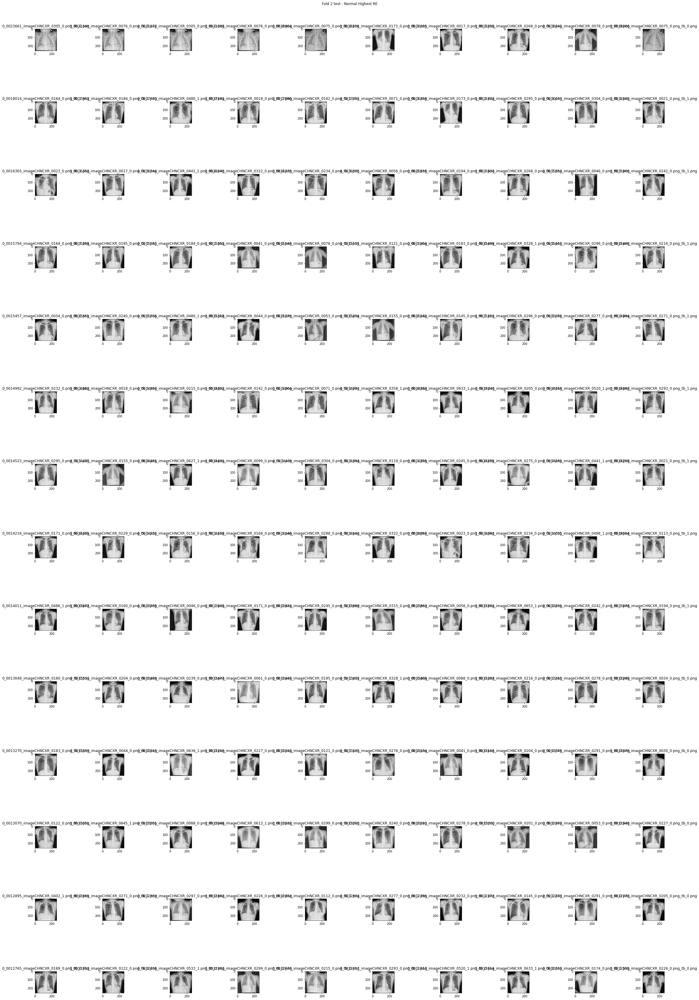

In [136]:
fig, axs = plt.subplots(nrows=14, ncols=10,figsize=(32,48))
ax = axs.ravel()

for idx,file in enumerate(sorted(list_of_files)[::-1][:140]):
#for idx,file in enumerate(sorted(list_of_files)[:140]):
    filepath=os.path.join(dirin,file)  

    img = Image.open(filepath) 
    img = img.convert('L')
    arr = array(img)
    if len(arr.shape) == 3:
        arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    img2 = Image.fromarray(arr)
    img3 = img2.resize((reduced_width,reduced_height), Image.ANTIALIAS)    
    arr3 = np.asarray(img3)
    ax[idx].imshow(arr3, cmap='gray', vmin=0, vmax=255)
    ax[idx].set_title(file)
    infofilename='CHNCXR_'+file.replace('image','').replace('_tb','').split('_')[-2].rjust(4, '0')+'_'+file.replace('image','').replace('_tb','').split('_')[-1]
    #try:
        #ax[idx].set_xlabel(info_dict[infofilename.split('.')[0]][-1]+', '+info_dict[infofilename.split('.')[0]][1]+', '+info_dict[infofilename.split('.')[0]][2])
    #except:
        #ax[idx].set_xlabel('')
        
plt.tight_layout()
plt.suptitle("Fold 2 test - Normal Highest RE", y=1)

In [45]:




img = mpimg.imread('your_image.png')
imgplot = plt.imshow(img)
plt.show()

In [50]:
    img = Image.open(filepath) 
    arr = array(img)
    if len(arr.shape) == 3:
        arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    img2 = Image.fromarray(arr)
    img3 = img2.resize((reduced_width,reduced_height), Image.ANTIALIAS)

66.0

In [ ]:
##PLOT_ALL

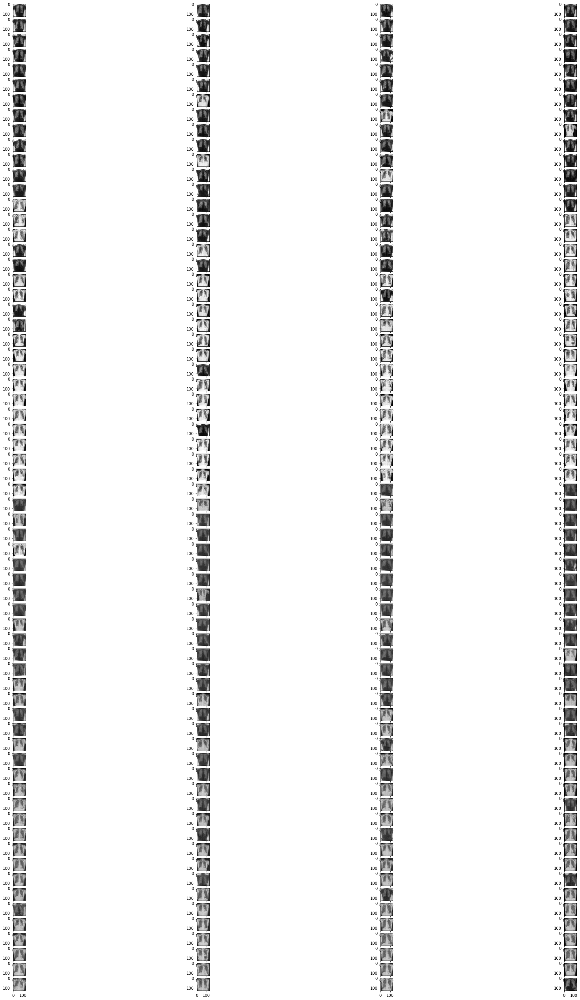

In [61]:
fig, axs = plt.subplots(nrows=66, ncols=4,figsize=(32,46))
ax = axs.ravel()

#list_of_files = sorted(os.listdir('./run/autoencoder/fold'+str(5)+'/test_reconstructed/'))

for idx,imag in enumerate(list_of_files):
    
    image = Image.open(dirin+imag).convert("L")
    arr = np.asarray(image)
    ax[idx].imshow(arr, cmap='gray', vmin=0, vmax=255)

plt.show()





fname = 'image.png'
plt.show()

In [55]:
ax[0].imshow(img)

In [31]:
fig, axs = plt.subplots(nrows=nrows, ncols=2)#,figsize=(18,12))
ax = axs.ravel()

#list_of_files = sorted(os.listdir('./run/autoencoder/fold'+str(5)+'/test_reconstructed/'))

for idx in range(len(list_of_files)):
    
    ximg = back_to_img(x_train[i],reduced_width) 
    rimg = back_to_img(restored_imgs[i],reduced_width)

    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    ax[idx].imshow(ximg.reshape(reduced_width,reduced_height))
    ax[idx].gray()
    
    #print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    #print("----------------------------")

plt.show()


ValueError: Illegal argument(s) to subplot: (3, 4)

<Figure size 432x288 with 0 Axes>

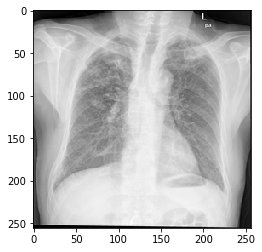

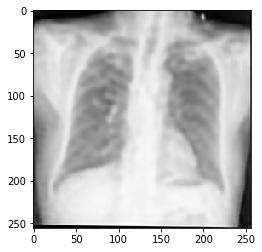

MSE: 0.0005936248394833008 SSIM: 0.8809583104084777
----------------------------


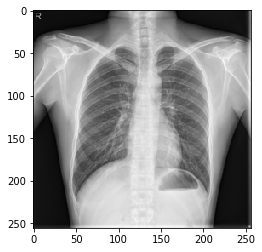

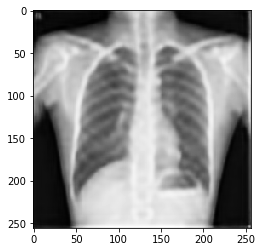

MSE: 0.0007352041496619696 SSIM: 0.8809583104084777
----------------------------


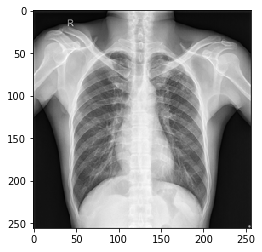

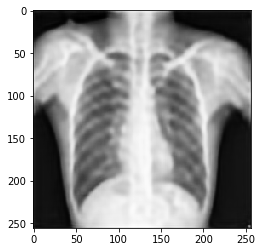

MSE: 0.0008535131326693884 SSIM: 0.8809583104084777
----------------------------


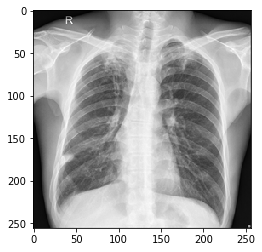

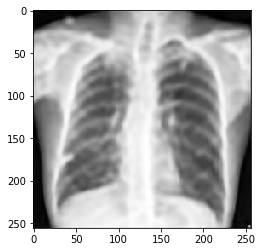

MSE: 0.0009132213986133741 SSIM: 0.8809583104084777
----------------------------


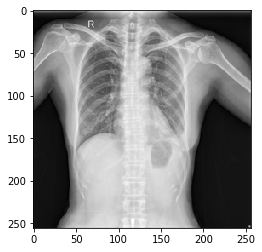

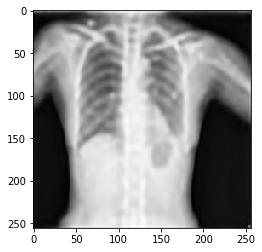

MSE: 0.0008025320393821795 SSIM: 0.8809583104084777
----------------------------


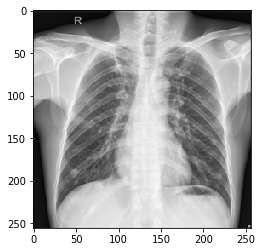

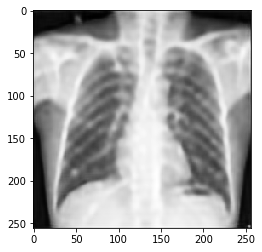

MSE: 0.0010004004131748644 SSIM: 0.8809583104084777
----------------------------


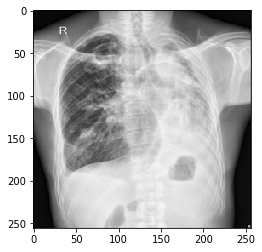

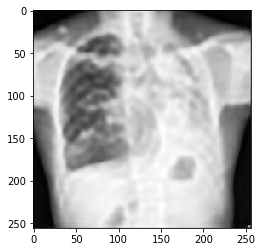

MSE: 0.0007936099334900385 SSIM: 0.8809583104084777
----------------------------


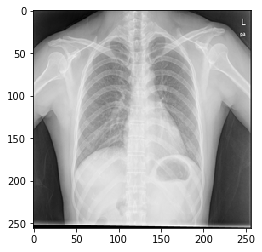

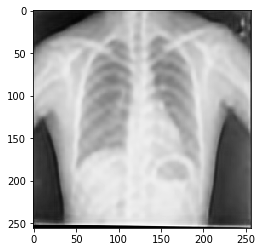

MSE: 0.0005498184049859723 SSIM: 0.8809583104084777
----------------------------


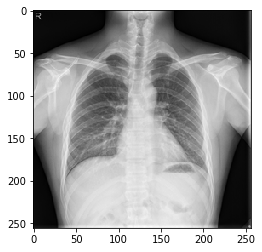

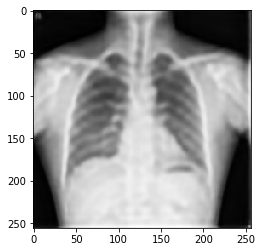

MSE: 0.0006341306313789849 SSIM: 0.8809583104084777
----------------------------


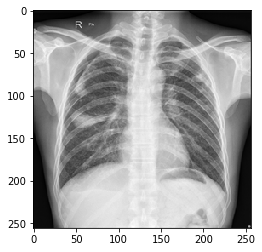

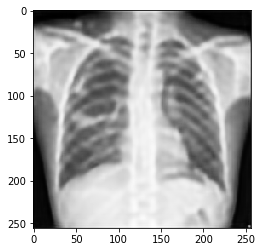

MSE: 0.001140316841464563 SSIM: 0.8809583104084777
----------------------------


In [137]:
for i in range(10):
    if serpentina:
        ximg = back_to_img(x_train[i],reduced_width) 
        rimg = back_to_img(restored_imgs[i],reduced_width)

        mse_img =  mean_squared_error(ximg, rimg)
        ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())

        plt.imshow(ximg.reshape(reduced_width,reduced_height))
        plt.gray()
        plt.show()

        plt.imshow(rimg.reshape(reduced_width,reduced_height))
        plt.gray()
        plt.show()

        print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
        print("----------------------------")
        
    else:

        ximg = x_train[i] 
        rimg = restored_imgs[i]

        mse_img =  mean_squared_error(ximg, rimg)
        #ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())

        plt.imshow(ximg.reshape(reduced_width,reduced_height))
        plt.gray()
        plt.show()

        plt.imshow(rimg.reshape(reduced_width,reduced_height))
        plt.gray()
        plt.show()

        print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
        print("----------------------------")

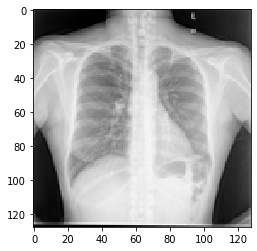

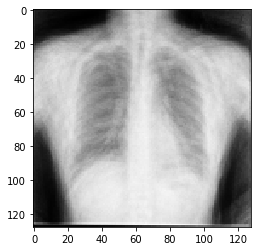

MSE: 0.00257942406387824 SSIM: 0.7182355603467323
----------------------------


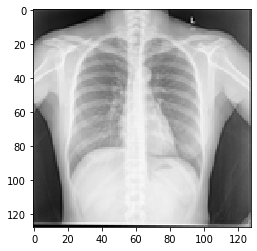

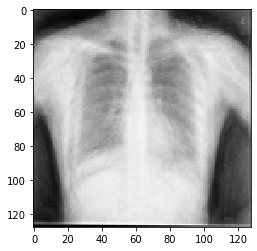

MSE: 0.0022963890056743787 SSIM: 0.7247694617659197
----------------------------


In [94]:
for i in range(2):
    ximg = back_to_img(x_test[i],reduced_width) 
    rimg = back_to_img(test_restored_imgs[i],reduced_width)

    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    plt.imshow(ximg.reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(rimg.reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    print("----------------------------")

Text(0.5, 1.0, 'Reconstruction Error Distribution')

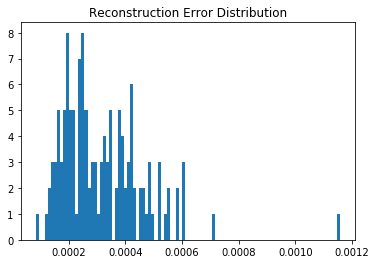

In [86]:
plt.hist(np.array(test_mse_list),bins=100)
plt.title("Reconstruction Error Distribution")

Text(0.5, 1.0, 'Reconstruction Error Distribution')

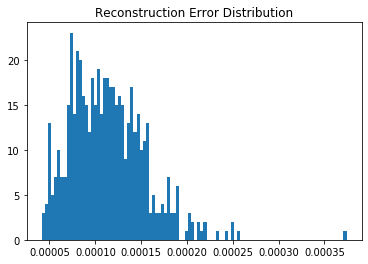

In [85]:
plt.hist(np.array(mse_list),bins=100)
plt.title("Reconstruction Error Distribution")

In [84]:
#mse_list[]
#mse_list[Y==0]

Text(0.5, 1.0, 'Reconstruction Error Distribution')

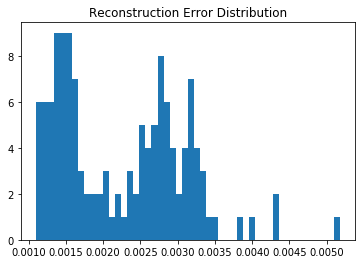

In [65]:
plt.hist(np.array(mse_list),bins=50)
plt.title("Reconstruction Error Distribution")

Text(0.5, 1.0, 'SSIM Distribution')

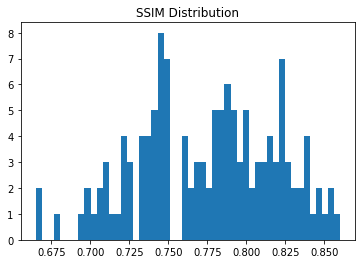

In [66]:
plt.hist(np.array(ssim_list),bins=50)
plt.title("SSIM Distribution")

In [63]:
mse_list

[0.0014526200106691504,
 0.0027936943919888704,
 0.0012578045366786305,
 0.001373138506422681,
 0.0028983097584039837,
 0.004286609148704321,
 0.002340138071744757,
 0.0016529691728996974,
 0.0012644619119210833,
 0.0030540486649626303,
 0.0013017854802444913,
 0.0033320416784165365,
 0.0015781942207270974,
 0.001101365666706899,
 0.002682279866313099,
 0.001767526830670572,
 0.0032189657085057817,
 0.001984252244380055,
 0.0028606181075732243,
 0.001524675745155735,
 0.002939442365507584,
 0.0014881587600779746,
 0.0026467666593855406,
 0.001347832963530706,
 0.0028704276839318665,
 0.0016208956901217705,
 0.0031091077762978305,
 0.002504581374845405,
 0.0029849994346406467,
 0.0027866535866730427,
 0.0023597460788190635,
 0.00340470303124023,
 0.0029366893106494577,
 0.002634241222474847,
 0.002327993705610083,
 0.0012636031710412186,
 0.001449538757908649,
 0.002227253507309823,
 0.0015561441551400711,
 0.0014017569283249283,
 0.0021858646161273714,
 0.0016296374375443484,
 0.001352

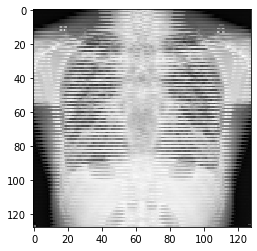

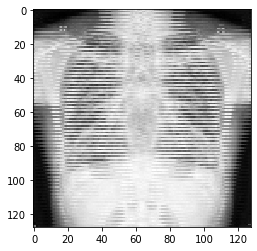

MSE: 0.0005390450733098426 SSIM: 0.9600944369183562
----------------------------


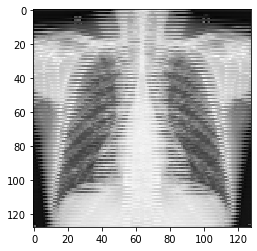

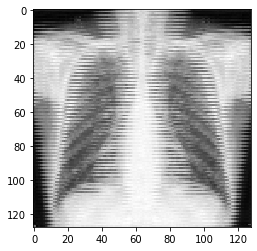

MSE: 0.0011673932752179414 SSIM: 0.9217041393393127
----------------------------


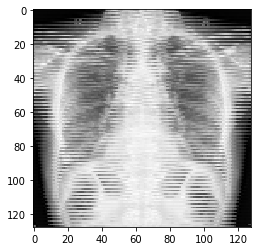

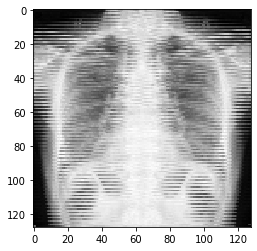

MSE: 0.0007847787141358992 SSIM: 0.947268779857522
----------------------------


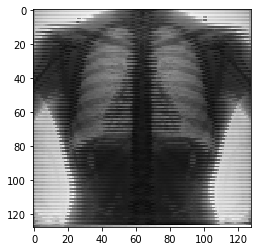

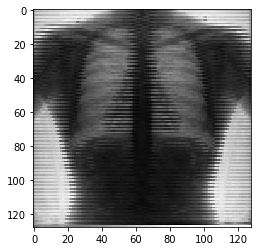

MSE: 0.0005429012029090309 SSIM: 0.9379666281184911
----------------------------


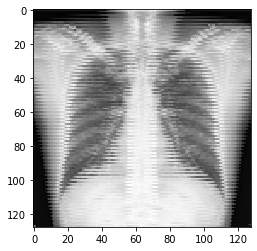

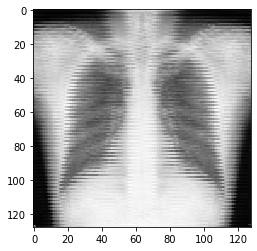

MSE: 0.001617894120674783 SSIM: 0.856113249499387
----------------------------


In [29]:
for i in range(5):
    ximg = x_train[i].reshape(reduced_width,reduced_height)
    plt.imshow(x_train[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    rimg = restored_imgs[i].reshape(reduced_width,reduced_height)
    
    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    print("----------------------------")

In [207]:
restored_imgs = model.predict(x_test,batch_size=4,verbose=1)

132/132 [==============================] - 0s 2ms/step


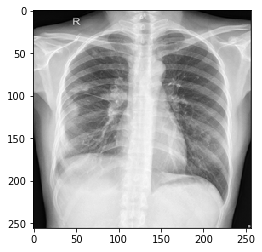

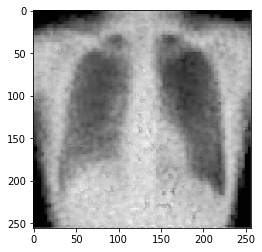

MSE: 0.008503989060683132 SSIM: 0.49910552755584126
----------------------------


In [208]:
for i in [44]:
    ximg = x_test[i].reshape(reduced_width,reduced_height)
    plt.imshow(x_test[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    rimg = restored_imgs[i].reshape(reduced_width,reduced_height)
    
    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    print("----------------------------")

In [190]:
print(256*256)
print(128*128*2,(256*256)/(128*128*2))
print(128*128*2,(256*256)/(128*128*1))
print(64*64*2,(256*256)/(64*64*2))
print(64*64*2,(256*256)/(32*32*4))

65536
32768 2.0
32768 4.0
8192 8.0
8192 16.0


## Draft

### Create Train and Test sets 

In [16]:
### divide samples for training and test
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

x_train.shape,y_train.shape, x_test.shape,y_test.shape

((529, 28, 28), (529,), (133, 28, 28), (133,))

In [17]:
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], 1) #transform 2D 28x28 matrix to 3D (28x28x1) matrix
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

x_train /= 255 #inputs have to be between [0, 1]
x_test /= 255

In [18]:
x_train.shape

(529, 28, 28, 1)

In [19]:
input_shape = (x_train.shape[1],x_train.shape[2],x_train.shape[3])
input_shape

(28, 28, 1)

## Create Network

In [20]:
#ENCODER
inp = Input(input_shape)
e = Conv2D(32, (3, 3), activation='relu')(inp)
e = MaxPooling2D((2, 2))(e)
e = Conv2D(64, (3, 3), activation='relu')(e)
e = MaxPooling2D((2, 2))(e)
e = Conv2D(64, (3, 3), activation='relu')(e)
l = Flatten()(e)
l = Dense(49, activation='softmax')(l)
#DECODER
d = Reshape((7,7,1))(l)
d = Conv2DTranspose(64,(3, 3), strides=2, activation='relu', padding='same')(d)
d = BatchNormalization()(d)
d = Conv2DTranspose(64,(3, 3), strides=2, activation='relu', padding='same')(d)
d = BatchNormalization()(d)
d = Conv2DTranspose(32,(3, 3), activation='relu', padding='same')(d)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(d)

model = Model(inp, decoded)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 3, 64)          36928     
_________________________________________________________________
flatten_1 (Flatten)          (None, 576)               0   

In [31]:
model = Sequential()

#1st convolution layer
model.add(Conv2D(128, (2, 2) #64 is number of filters and (3, 3) is the size of the filter.
    , padding='same', input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

#2nd convolution layer
#model.add(Conv2D(64,(2, 2), padding='same')) # apply 16 filters sized of (3x3)
#model.add(Activation('relu'))
#model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

#2nd convolution layer
#model.add(Conv2D(16,(2, 2), padding='same')) # apply 16 filters sized of (3x3)
#model.add(Activation('relu'))
#model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

#3rd convolution layer
model.add(Conv2D(2,(2, 2), padding='same')) # apply 2 filters sized of (3x3)
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

###model.add(Flatten())
#model.add(Dense(units = 8192, activation = 'relu'))

###model.add(Dense(units = 6000, activation = 'relu'))

#-------------------------
###model.add(Dense(units = 8192, activation = 'relu'))

###model.add(Reshape((64,64,2)))

#4 convolution layer
model.add(Conv2D(2,(2, 2), padding='same')) # apply 2 filters sized of (3x3)
model.add(Activation('relu'))
model.add(UpSampling2D((2, 2)))

#5 convolution layer
#model.add(Conv2D(16,(2, 2), padding='same'))
#model.add(Activation('relu'))
#model.add(UpSampling2D((2, 2)))


#5 convolution layer
#model.add(Conv2D(64,(2, 2), padding='same'))
#model.add(Activation('relu'))
#model.add(UpSampling2D((2, 2)))

#6 convolution layer
model.add(Conv2D(129,(2, 2), padding='same'))
model.add(Activation('relu'))
model.add(UpSampling2D((2, 2)))


#-------------------------

model.add(Conv2D(1,(3, 3), padding='same'))
#model.add(Activation('sigmoid'))
model.add(Activation('relu'))

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 64, 64, 128)       640       
_________________________________________________________________
activation_16 (Activation)   (None, 64, 64, 128)       0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 32, 32, 2)         1026      
_________________________________________________________________
activation_17 (Activation)   (None, 32, 32, 2)         0         
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 16, 16, 2)         0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 16, 16, 2)        

In [193]:
print(256*256)
print(128*128*2,(256*256)/(128*128*2))
print(64*64*2,(256*256)/(64*64*2))


65536
32768 2.0
8192 8.0


In [234]:
32*32*16

32768

### Fit model

In [ ]:
print('olar')

In [65]:



#import tensorflow as tf
#config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
#sess = tf.Session(config=config)

In [21]:
%%time

model.compile(optimizer='adam', loss='mse')
es = EarlyStopping(monitor='val_loss', verbose=1, patience=5)
history = model.fit(x_train, x_train
    , epochs=25
    , batch_size = 4
    , validation_data=(x_test, x_test)
    , callbacks=[es]
)

Train on 529 samples, validate on 133 samples
Epoch 1/25


UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node conv2d_1/convolution (defined at /home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/tensorflow_core/python/framework/ops.py:1751) ]] [Op:__inference_keras_scratch_graph_3787]

Function call stack:
keras_scratch_graph


In [24]:
!cat /usr/local/cuda/include/cudnn.h | grep CUDNN_MAJOR -A 2

#define CUDNN_MAJOR 7
#define CUDNN_MINOR 5
#define CUDNN_PATCHLEVEL 1
--
#define CUDNN_VERSION (CUDNN_MAJOR * 1000 + CUDNN_MINOR * 100 + CUDNN_PATCHLEVEL)

#include "driver_types.h"


### Train and Validation Error

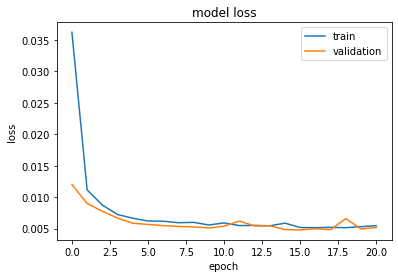

In [267]:
plt.plot(history.history['loss'],)
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
https://ourcodeworld.com/articles/read/991/how-to-calculate-the-structural-similarity-index-ssim-between-two-images-with-python#:~:text=Project%20for%20College-,How%20to%20calculate%20the%20Structural%20Similarity%20Index%20(SSIM,between%20two%20images%20with%20Python&text=The%20Structural%20Similarity%20Index%20(SSIM)%20is%20a%20perceptual%20metric%20that,by%20losses%20in%20data%20transmission.

### Train images reconstruction

In [276]:
restored_imgs = model.predict(x_train,batch_size=4,verbose=1)

529/529 [==============================] - 1s 959us/step


In [24]:
#x_train[i].reshape(reduced_width,reduced_height)

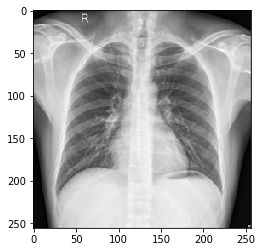

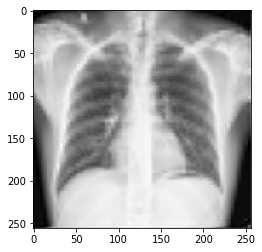

MSE: 0.0010262826250782694 SSIM: 0.8443962964256401
----------------------------


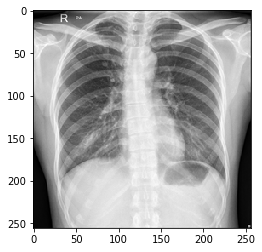

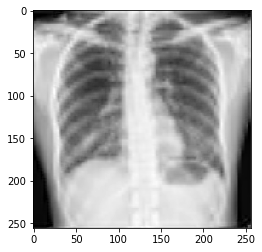

MSE: 0.001265912322078042 SSIM: 0.8207690720812871
----------------------------


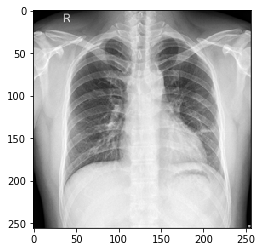

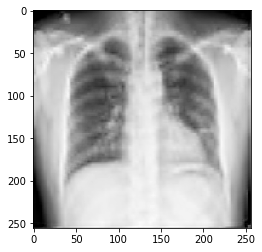

MSE: 0.0009887045094525532 SSIM: 0.8439451978710911
----------------------------


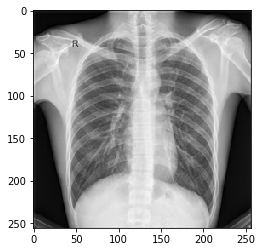

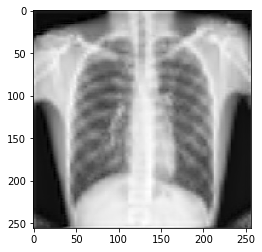

MSE: 0.0012189936655094813 SSIM: 0.8319775633254499
----------------------------


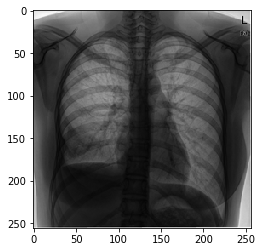

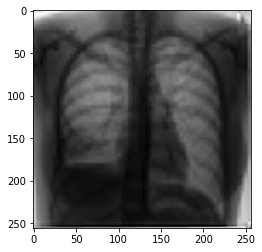

MSE: 0.0010602573888679764 SSIM: 0.8540672480360872
----------------------------


In [277]:
for i in range(5):
    ximg = x_train[i].reshape(reduced_width,reduced_height)
    plt.imshow(x_train[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    rimg = restored_imgs[i].reshape(reduced_width,reduced_height)
    
    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    print("----------------------------")

In [278]:
%%time
mse_list=[]
ssim_list=[]
for i in range(x_train.shape[0]):
    ximg = x_train[i].reshape(reduced_width,reduced_height)
    rimg = restored_imgs[i].reshape(reduced_width,reduced_height)

    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    mse_list.append(mse_img)        
    ssim_list.append(ssim_img)
    #print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    #print("----------------------------")


CPU times: user 1.78 s, sys: 0 ns, total: 1.78 s
Wall time: 1.78 s


In [279]:
print(np.mean(mse_list),np.std(mse_list))
print(np.mean(ssim_list),np.std(ssim_list))

0.0011061081437492273 0.00034257118519213746
0.8605312683744313 0.020157557247881604


In [79]:
print(np.mean(mse_list),np.std(mse_list))
print(np.mean(ssim_list),np.std(ssim_list))

0.001288100168795984 0.0004132806907349949
0.8375700806003965 0.018092826672095635


In [74]:
print(np.mean(mse_list),np.std(mse_list))
print(np.mean(ssim_list),np.std(ssim_list))

0.002061588855120685 0.0005467222810723566
0.744462424132873 0.03666503868914016


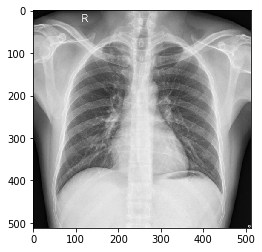

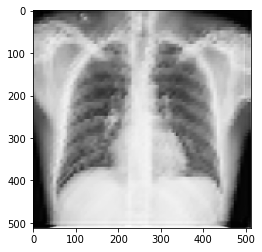

MSE: 0.0017891454625168675 SSIM: 0.7202222185772127
----------------------------


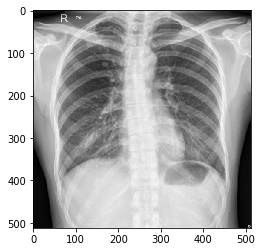

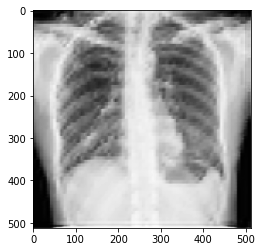

MSE: 0.0022203633198276574 SSIM: 0.6736600308300981
----------------------------


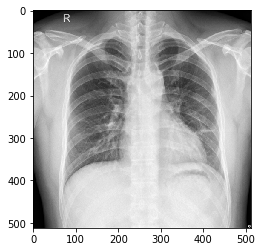

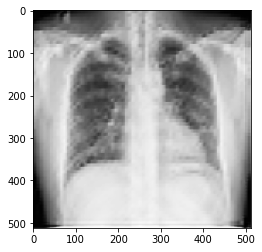

MSE: 0.0017767005433860558 SSIM: 0.7157259113847366
----------------------------


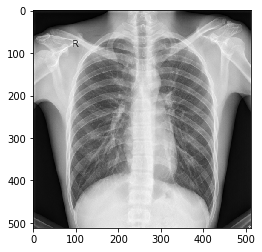

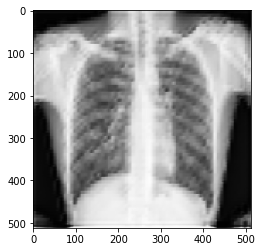

MSE: 0.0021412588723913944 SSIM: 0.6954914136110113
----------------------------


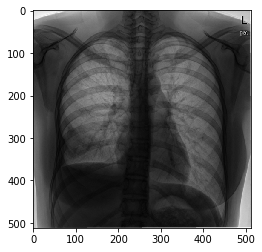

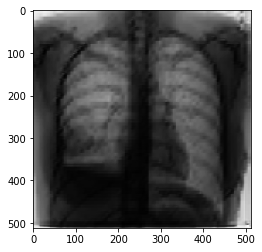

MSE: 0.0020283894907362253 SSIM: 0.7746599993107396
----------------------------


In [66]:
for i in range(5):
    ximg = x_train[i].reshape(reduced_width,reduced_height)
    plt.imshow(x_train[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    rimg = restored_imgs[i].reshape(reduced_width,reduced_height)
    
    mse_img =  mean_squared_error(ximg, rimg)
    ssim_img = ssim(ximg, rimg, data_range=rimg.max() - rimg.min())
    
    print("MSE: "+str(mse_img),"SSIM: "+str(ssim_img)) 
    print("----------------------------")

### Predict test images reconstruction

In [90]:
restored_imgs = model.predict(x_test)

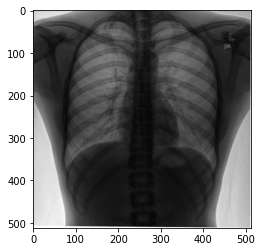

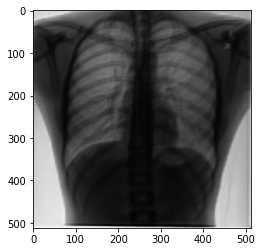

----------------------------


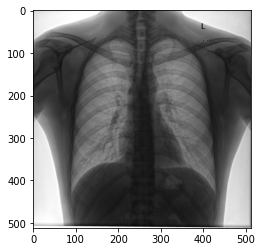

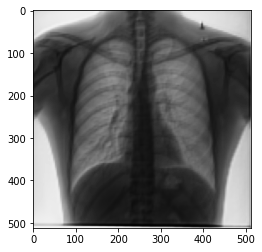

----------------------------


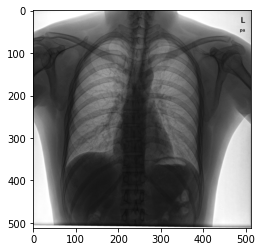

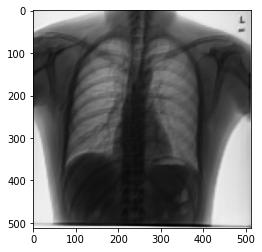

----------------------------


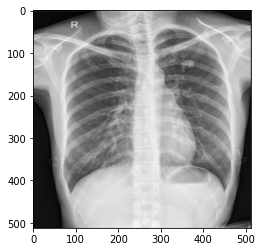

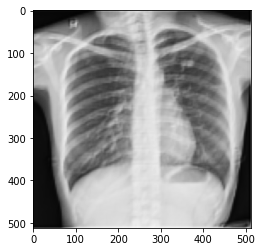

----------------------------


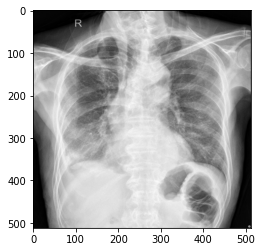

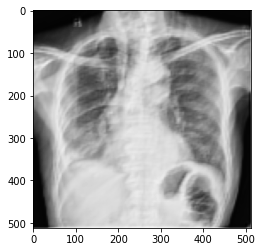

----------------------------


In [92]:

for i in range(5):
    plt.imshow(x_test[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    print("----------------------------")

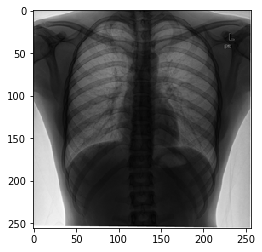

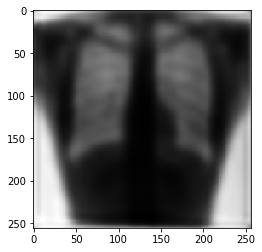

----------------------------


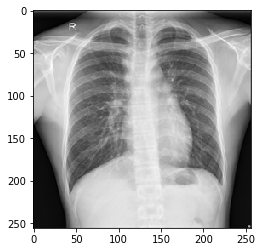

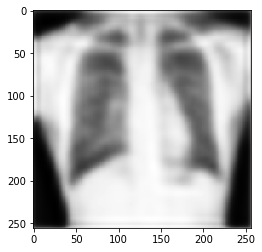

----------------------------


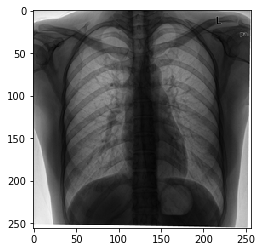

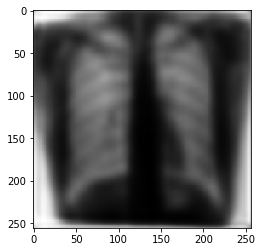

----------------------------


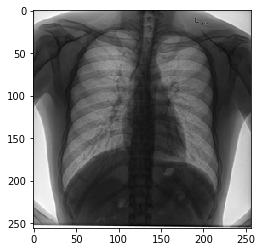

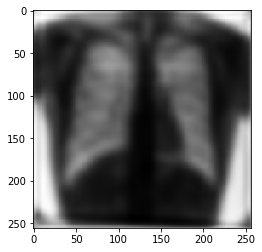

----------------------------


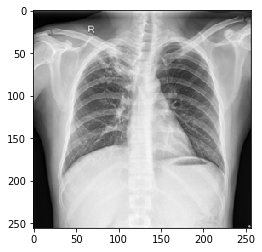

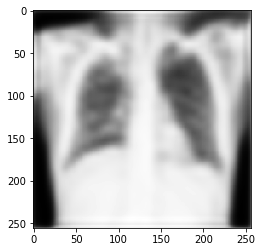

----------------------------


In [ ]:

for i in range(5):
    plt.imshow(x_test[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    plt.imshow(restored_imgs[i].reshape(reduced_width,reduced_height))
    plt.gray()
    plt.show()
    
    print("----------------------------")

In [297]:
x_train[:100].shape,x_train[100:200].shape,x_train[200:300].shape,x_train[300:400].shape,x_train[400:500].shape,x_train[500:].shape

((100, 256, 256, 1),
 (100, 256, 256, 1),
 (100, 256, 256, 1),
 (100, 256, 256, 1),
 (100, 256, 256, 1),
 (29, 256, 256, 1))

In [216]:
x_train.shape,x_test.shape

((530, 256, 256, 1), (132, 256, 256, 1))

In [214]:
compressed_list=[]
compressed_layer = 5
get_3rd_layer_output = K.function([model.layers[0].input], [model.layers[compressed_layer].output])
compressed_list.append(get_3rd_layer_output([x_train[:100]])[0])
compressed_list.append(get_3rd_layer_output([x_train[100:200]])[0])
compressed_list.append(get_3rd_layer_output([x_train[200:300]])[0])
compressed_list.append(get_3rd_layer_output([x_train[300:400]])[0])
compressed_list.append(get_3rd_layer_output([x_train[400:500]])[0])
compressed_list.append(get_3rd_layer_output([x_train[500:]])[0])
 
#flatten compressed representation to 1 dimensional array
#compressed = compressed.reshape(10000,7*7*2)

In [217]:
np.vstack(compressed_list).reshape(530,64*64*2).shape

(530, 8192)

In [218]:
%%time
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2).fit_transform(np.vstack(compressed_list).reshape(530,64*64*2))

CPU times: user 4.55 s, sys: 497 µs, total: 4.56 s
Wall time: 4.55 s


(529, 65536)

In [324]:
X_embedded_original = TSNE(n_components=2).fit_transform(x_train.reshape(529,256*256))

In [309]:
X_embedded.shape,y_train.shape

((529, 2), (529,))

In [315]:
!pip3 install seaborn

     |████████████████████████████████| 283 kB 9.6 MB/s eta 0:00:01
     |████████████████████████████████| 9.5 MB 11.6 MB/s eta 0:00:01
     |████████████████████████████████| 510 kB 11.3 MB/s eta 0:00:01


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Segunda componente')

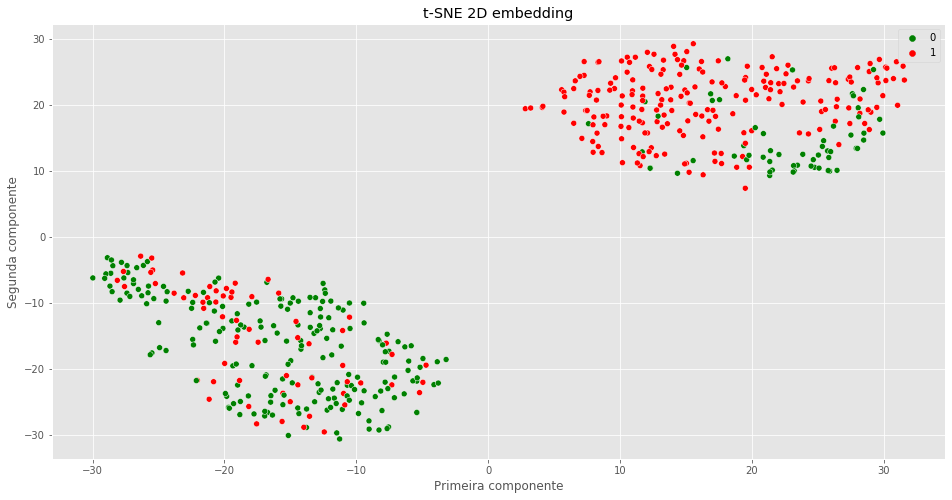

In [233]:
import seaborn as sns
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(16,8))
color_dict= dict({'TB':'r',
                 'Não TB':'g'})
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_train, legend='full',palette=['g','r'])
plt.title("t-SNE 2D embedding")
plt.xlabel("Primeira componente")
plt.ylabel("Segunda componente")

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


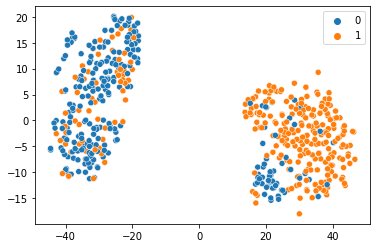

In [325]:
import seaborn as sns
sns.scatterplot(X_embedded_original[:,0], X_embedded_original[:,1], hue=y_train, legend='full')

In [ ]:
import seaborn as sns
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_train, legend='full')

In [ ]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)